In [1]:
import torch
import pandas as pd
import numpy as np
from numpy import random
import torch.nn as nn
from torch.amp import autocast
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from tabulate import tabulate

from utils import *
from evaluate import evaluate, save_predictions
from metrics import calculate_dtw_distances, calculate_dtw_for_index, plot_dtw_alignment_for_index, calculate_wasserstein_distance

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [19]:
device_name = 'cuda:0'
#name = "edm_bs16_do10_cgt10_cg2_ns50_norm"
#name = "edm_bs16_do10_cgt10_cg2_ns30_norm"
name = "edm_bs16_do10_cgt10_cg1_ns30_norm"
cfg_scale = 1
noise_steps = 30
epoch = 15


#-------------------------------------------------------------
test_data_path = "../data/val_data_stg7_norm.csv"
#test_data_path = "../data/for_testing.csv"
predictions_path = "predictions/" + name + "/preds_epoch" + str(epoch) +".csv"
model_path = "models/" + name + "/ema_ckpt" + str(epoch) + ".pt"
scale_predictor_path = "models/" + name + "/scale_predictor" + str(epoch) + ".pt"

# Make predictions on test data

In [20]:
# Function to convert comma-separated strings to lists of floats
def str_to_float_list(s):
    return np.array(list(map(float, s.strip('[]').split(','))))


In [21]:
df_preds = pd.read_csv(predictions_path)
df_preds.head()

,x_real,cond_vectors,predictions
0,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.6222,0.1626,-0.3527,-1.4393,-1.0,-1.0,-2.46...","-0.9948333,-0.99509573,-0.99808425,-0.99814725..."
1,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.6222,0.1626,-0.3652,-1.4122,-1.0,-1.0,-2.45...","-0.9895526,-0.9904849,-0.99249476,-0.99417585,..."
2,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.6222,0.1626,-0.3439,-1.3689,-1.0,-1.0,-2.48...","-0.99763215,-0.9905442,-0.9949986,-0.9948218,-..."
3,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.6222,0.1626,-0.3439,-1.3279,0.0,-1.0,-2.484...","-0.9962934,-0.9967597,-0.9968955,-0.9978201,-0..."
4,"-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-...","-0.6222,0.1626,-0.3439,-1.369,-1.0,-1.0,-2.471...","-0.9885567,-0.9896844,-0.98326045,-0.987114,-0..."


In [22]:
x_real = np.array([str_to_float_list(row) for row in df_preds['x_real']])
cond_vectors = np.array([str_to_float_list(row) for row in df_preds['cond_vectors']])
predictions = np.array([str_to_float_list(row) for row in df_preds['predictions']])

In [23]:
mse_error = np.mean((x_real - predictions) ** 2)
print(f"MSE error: {mse_error:.6f}")

MSE error: 0.011402


# Intro into data

In [24]:
# Find indices and values greater than 0.5
indices = np.where(np.any(x_real > 0.5, axis=1))[0]
filtered_values = [x_real[idx][x_real[idx] > 0.5] for idx in indices]
filtered_predictions = [predictions[idx][x_real[idx] > 0.5] for idx in indices]

# Flatten results and take the first 50
flat_filtered_values = np.concatenate(filtered_values)[:50]
flat_filtered_predictions = np.concatenate(filtered_predictions)[:50]

# Print the results side by side
print("Filtered Values (greater than 0.5) from x_real and corresponding Predictions:")
for value, prediction in zip(flat_filtered_values, flat_filtered_predictions):
    print(f"{value:.5f}\t\t\t{prediction:.5f}")

Filtered Values (greater than 0.5) from x_real and corresponding Predictions:
0.51487			0.22174
0.55362			0.23923
0.64357			0.24987
0.68923			0.23429
0.67853			0.20268
0.65260			0.17525
0.54108			0.12900
0.51773			0.23076
0.57349			0.24164
0.62256			0.24311
0.61528			0.21178
0.57397			0.18309
0.64593			0.17805
0.77349			0.18000
0.85504			0.20562
0.86485			0.18723
0.84063			0.15859
0.72056			0.09618
0.51409			0.01496
0.52050			0.35170
0.55932			0.37559
0.53494			0.35929
0.53824			0.33503
0.61109			0.41511
0.63966			0.44500
0.62554			0.40371
0.58251			0.33948
0.53417			0.50782
0.56786			0.53614
0.54862			0.51046
0.52221			0.51777
0.54906			0.53424
0.52981			0.51967
0.62884			0.49368
0.72221			0.55173
0.77641			0.60972
0.74691			0.57525
0.68679			0.51967
0.57526			0.38991
0.52627			0.50623
0.60768			0.58775
0.63453			0.61185
0.61357			0.62158
0.55003			0.56724
0.55810			0.58467
0.56444			0.63770
0.54520			0.60898
0.50730			0.52165
0.55810			0.85485
0.58325			0.86106


In [25]:
# Find indices where predictions > 0.8 and corresponding x_real < 0.5
indices = np.where((predictions > 0.8) & (x_real < 0.1))

# Extract filtered values from x_real and predictions
filtered_x_real = x_real[indices]
filtered_predictions = predictions[indices]

# Print the results side by side
print("Filtered x_real (values < 0.1) and corresponding Predictions (values > 0.8):")
for x_val, pred_val in zip(filtered_x_real.flatten(), filtered_predictions.flatten()):
    print(f"{x_val:.5f}\t\t\t{pred_val:.5f}")

Filtered x_real (values < 0.1) and corresponding Predictions (values > 0.8):
0.06017			0.80842
0.09094			0.81033
0.06701			0.80811
0.08239			0.80286
0.09436			0.83775
0.05118			0.84786
0.09656			0.81394
0.09094			0.85755
0.06485			0.83754
0.09733			0.81783
0.09904			0.82777
-0.16123			0.83498
-0.16650			0.80029
-0.10232			0.87144
-0.11272			0.85548
-0.07998			0.87981
-0.09313			0.87640
-0.10190			0.84257
-0.10091			0.83934


# Visualization of results

In [26]:
wavelengths = np.load('../data/wavelengths.npy')

In [27]:
wavelengths

array([ 634.835144,  635.296997,  635.758911, ..., 1123.063232,
       1123.557739, 1124.052368])

## Plot predictions

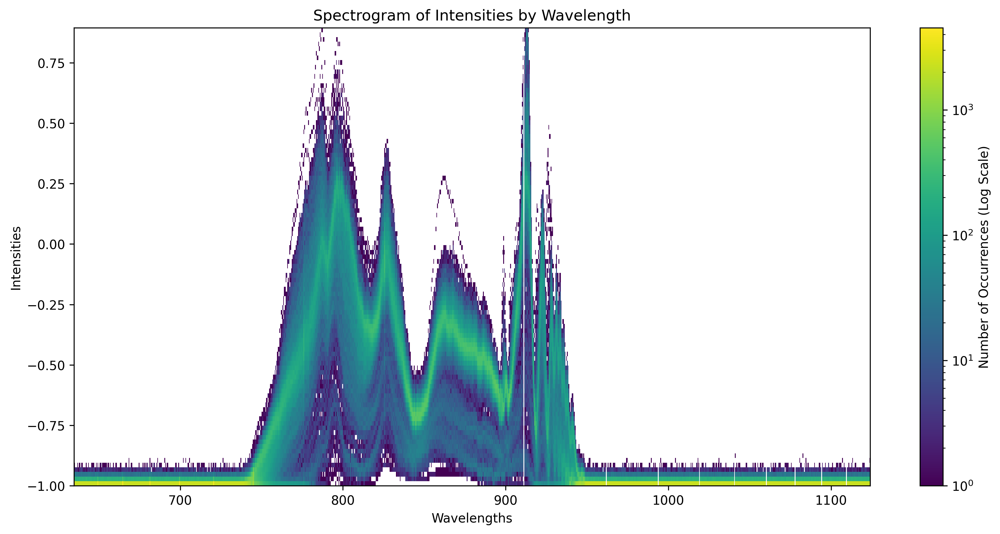

In [28]:
create_spectrogram(wavelengths, predictions, label="Spectrogram of Intensities by Wavelength")

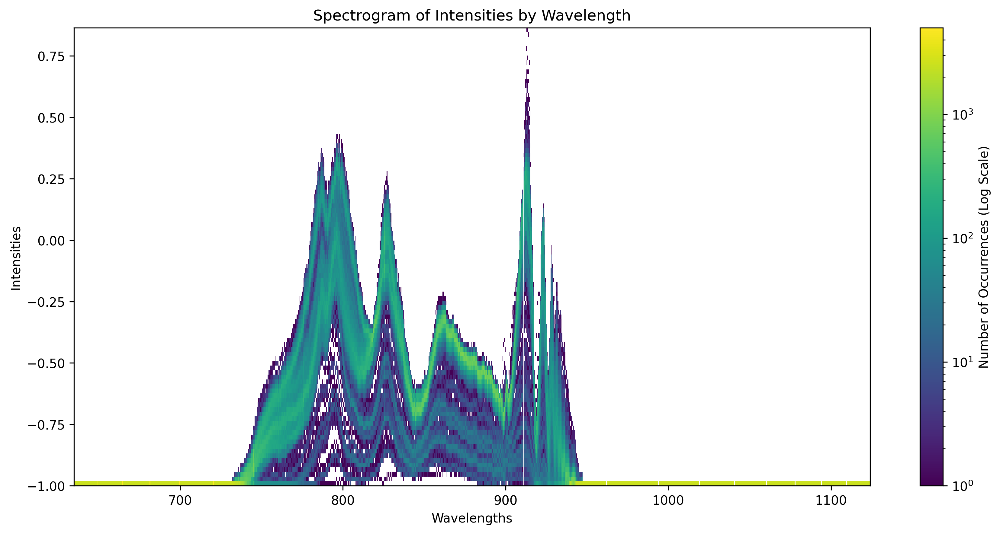

In [29]:
create_spectrogram(wavelengths, x_real, label="Spectrogram of Intensities by Wavelength")

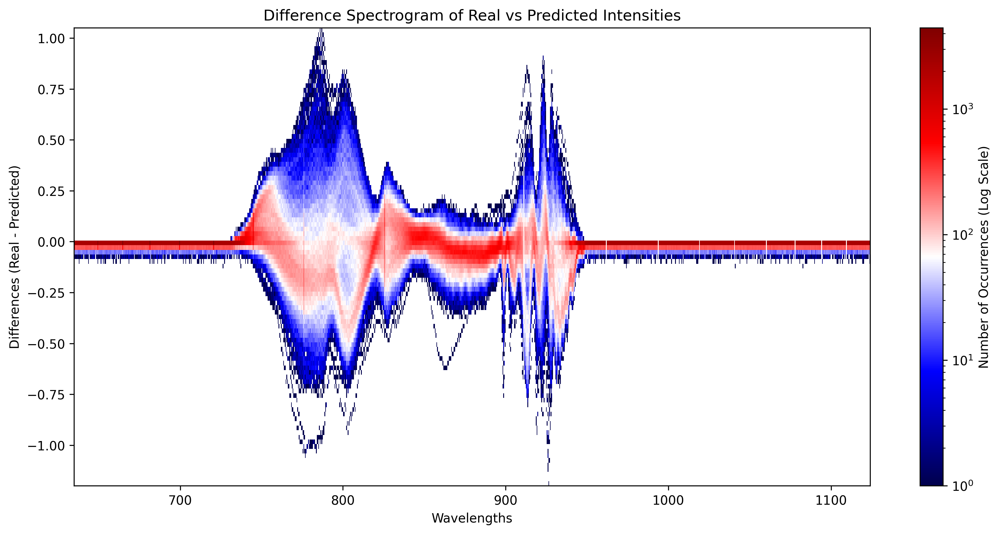

In [30]:
create_difference_spectrogram(wavelengths, 
                              x_real, 
                              predictions, 
                              label="Difference Spectrogram of Real vs Predicted Intensities")

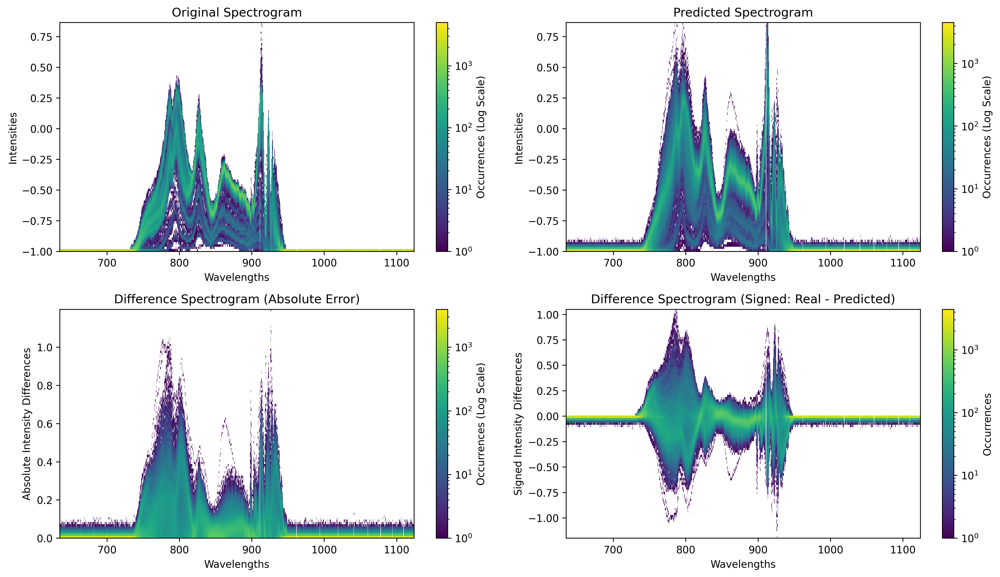

In [31]:
create_combined_spectrogram(wavelengths, 
                            x_real, 
                            predictions)

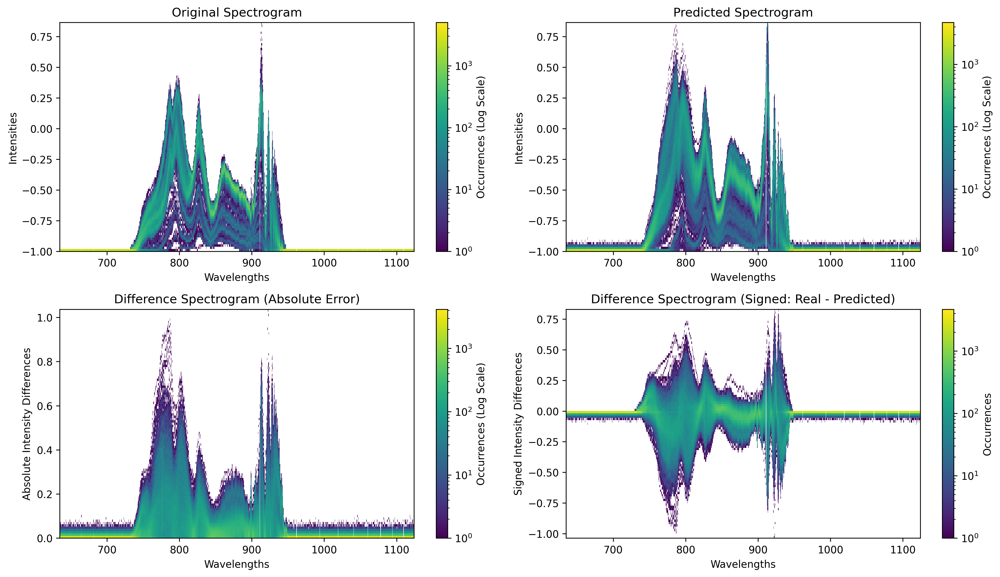

In [18]:
create_combined_spectrogram(wavelengths, 
                            x_real, 
                            predictions)

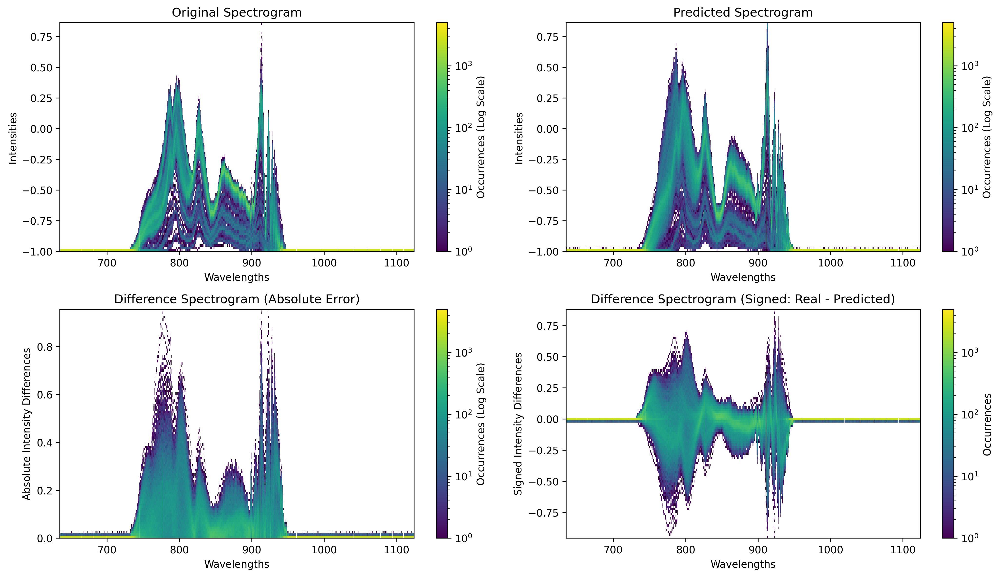

In [14]:
create_combined_spectrogram(wavelengths, 
                            x_real, 
                            predictions)

## Influence of parameters to predictions

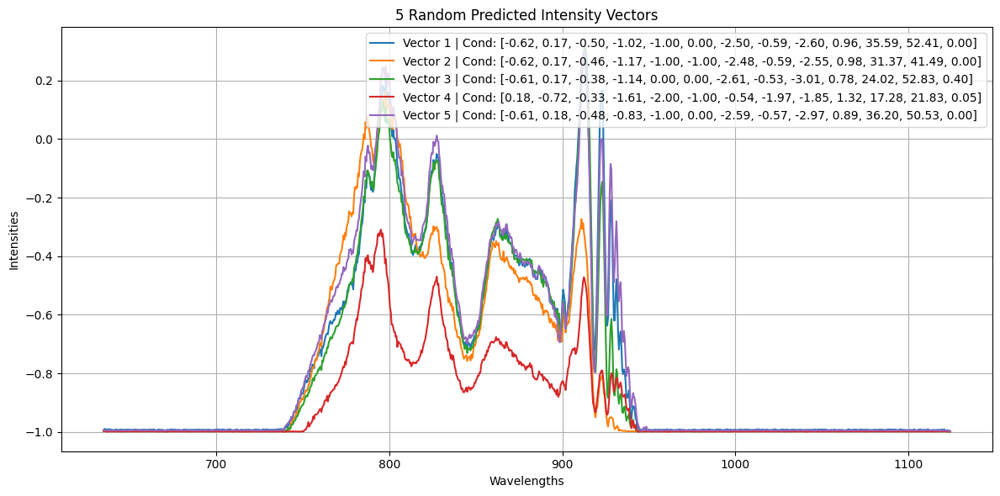

In [16]:
plot_random_intensity_vectors(wavelengths, predictions, cond_vectors)

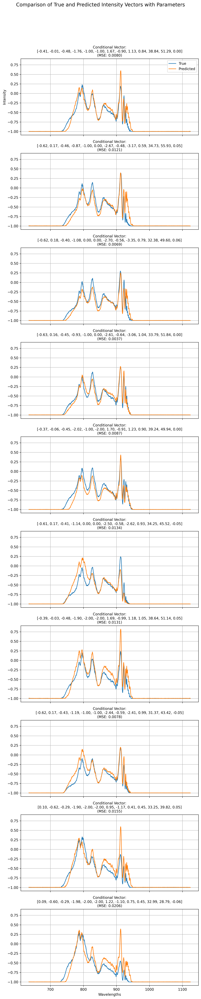

In [17]:
indices = np.random.choice(len(x_real), size=10, replace=False)

selected_real, selected_predicted, selected_conditions = plot_combined_intensity_vectors_with_parameters(
    wavelengths, x_real, predictions, cond_vectors, indices, num_vectors=10
)

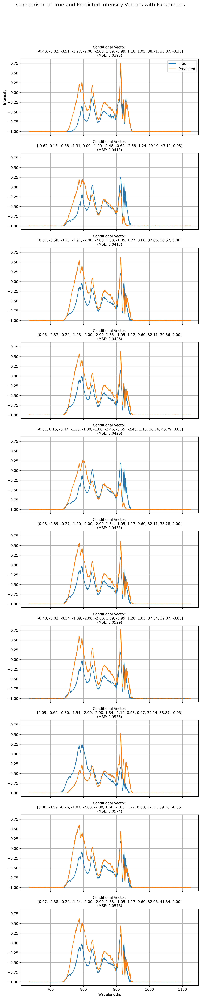

In [18]:
worst_indices = get_worst_mse_indices(x_real, predictions, n=10)
selected_real, selected_predicted, selected_conditions = plot_combined_intensity_vectors_with_parameters(
    wavelengths, x_real, predictions, cond_vectors, worst_indices, num_vectors=10
)

MSE Statistics:
Mean: 0.0093
Median: 0.0078
Standard Deviation: 0.0065
Min: 0.0000
Max: 0.0578
Range: 0.0578
Median (Q2): 0.0078
First Quartile (Q1): 0.0052
Third Quartile (Q3): 0.0118
Interquartile Range (IQR): 0.0066
Upper Whisker: 0.0216
Number of Outliers: 129.0000
Outliers: [0.02810302824047141, 0.025673492225472598, 0.032193932112821705, 0.041298744991169464, 0.0258807497324305, 0.03841025582964625, 0.04260101601812606, 0.022002971167385078, 0.02818453167734017, 0.022935655091287664]...


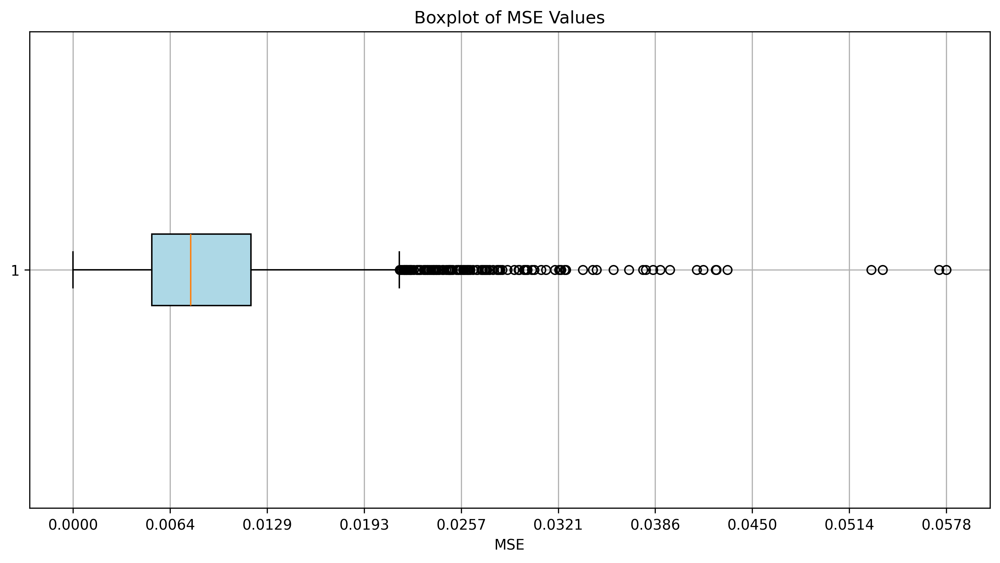

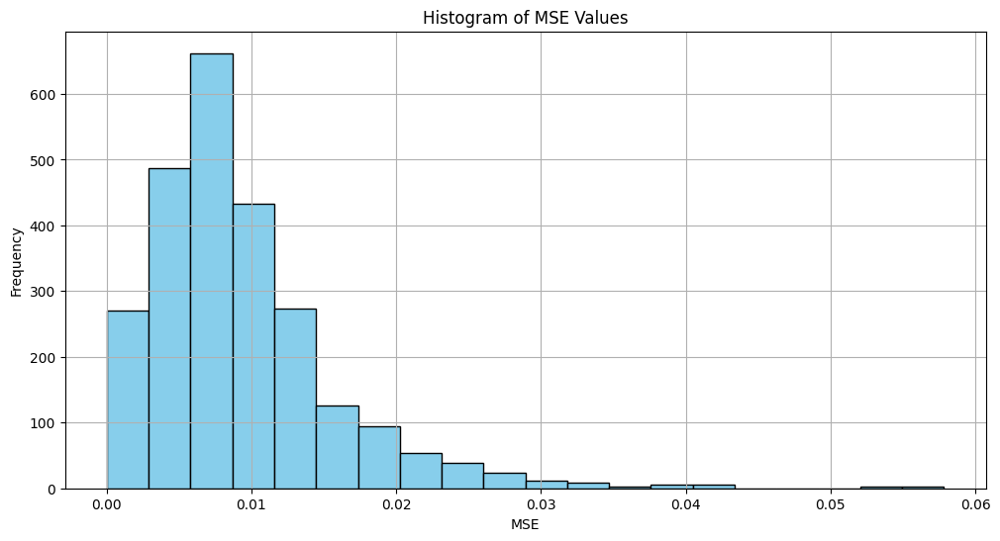

In [19]:
mse_stats = mse_statistics(x_real, predictions)

## Try Random conditional vectors

In [20]:
x_real_nonsense, cond_vectors_nonsense, predictions_nonsense = evaluate(device=device_name,
                                             test_csv_path="../data/data_nonsense.csv",
                                             model_path=model_path,
                                             scale_predictor_path=scale_predictor_path,
                                             n_samples=1,
                                             s_type='edm',
                                             cfg_scale=cfg_scale,
                                             noise_steps=noise_steps)

Testing loop: 100%|█████████████████████████████████████████| 17/17 [00:27<00:00,  1.62s/it]


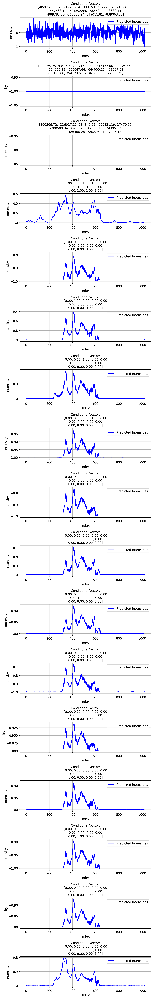

In [21]:
plot_predictions_with_cond_vectors(predictions_nonsense, cond_vectors_nonsense, num_rows=17)

## Compare distributions

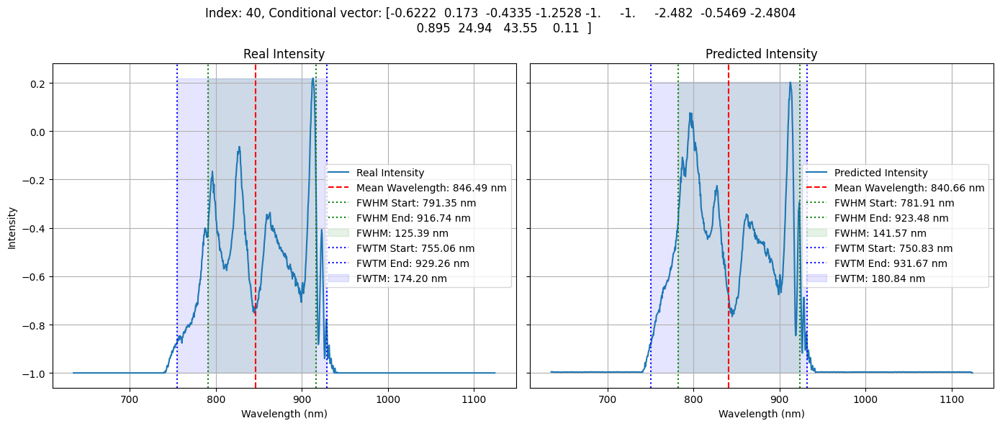

In [22]:
plot_comparison(index=40, wavelengths=wavelengths, x_real=x_real, predictions=predictions, cond_vectors=cond_vectors)

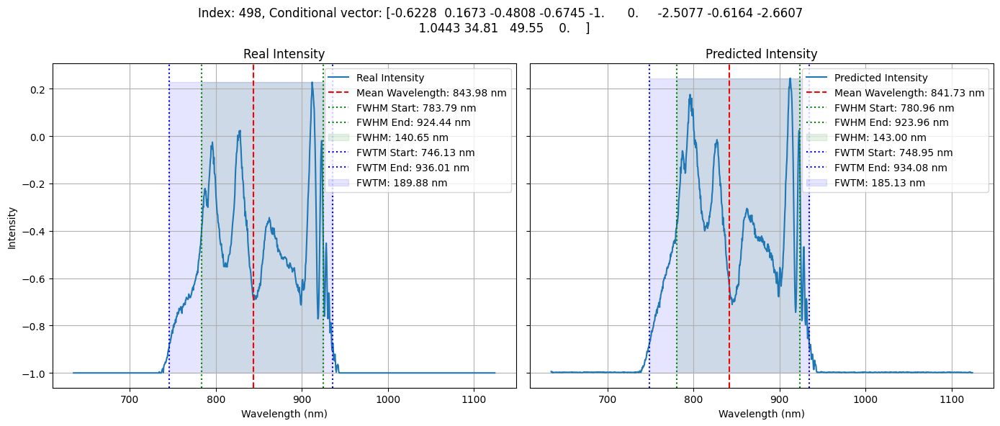

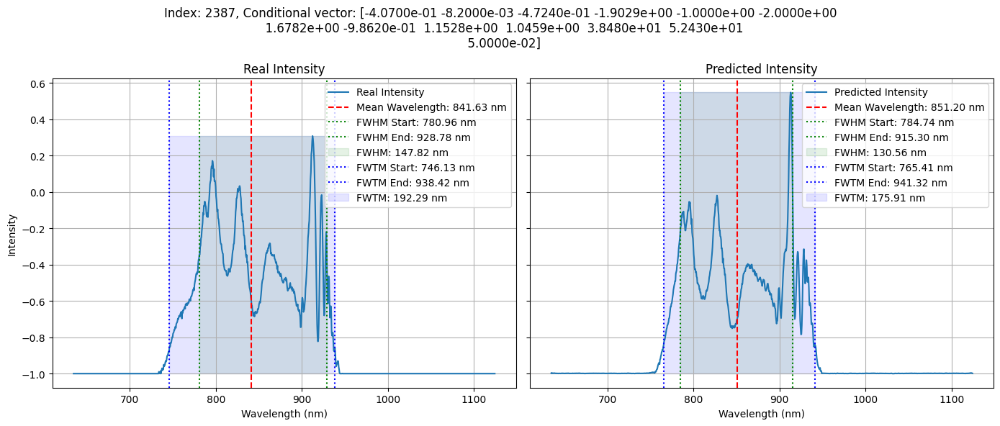

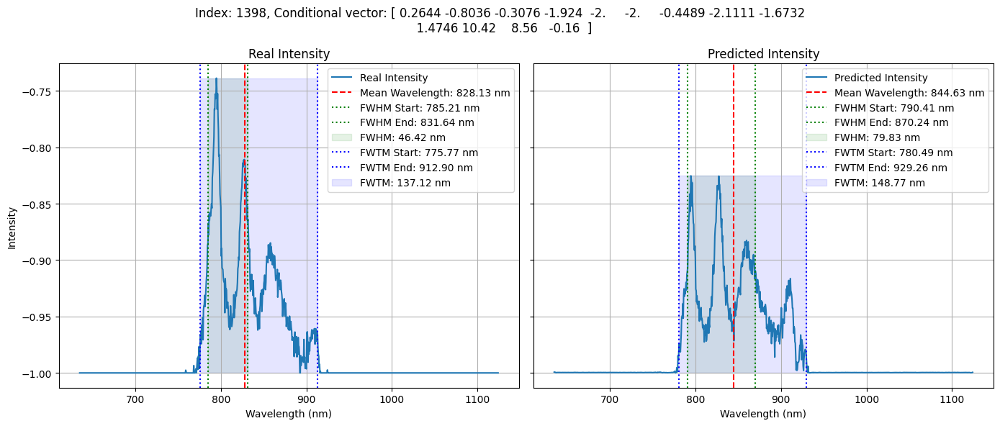

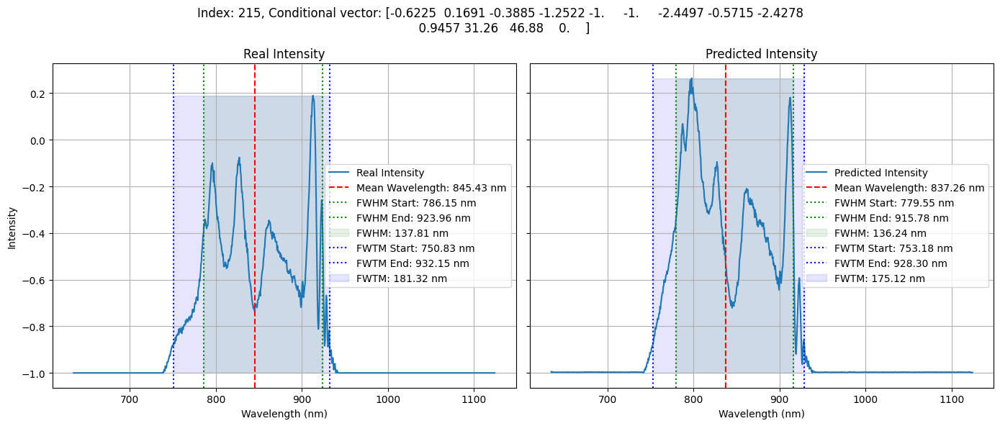

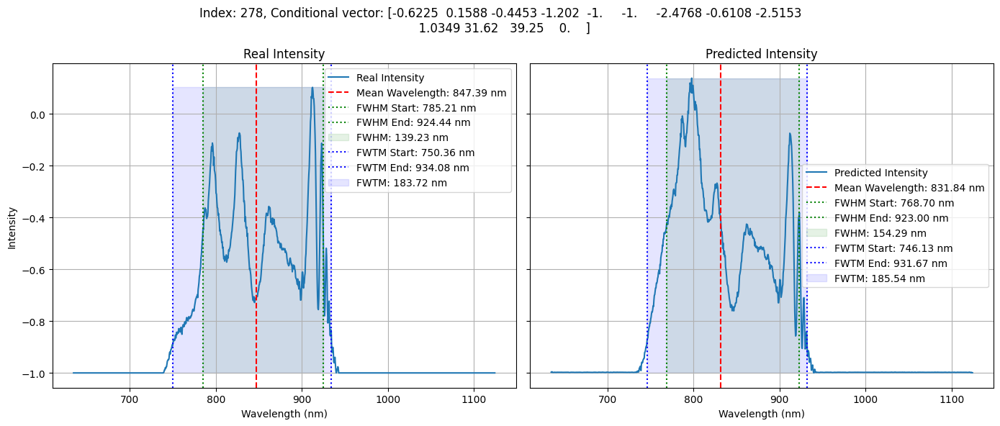

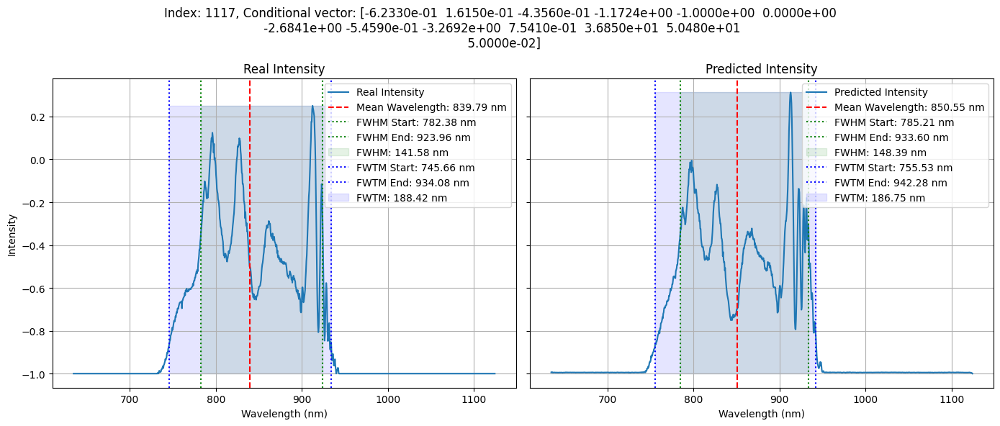

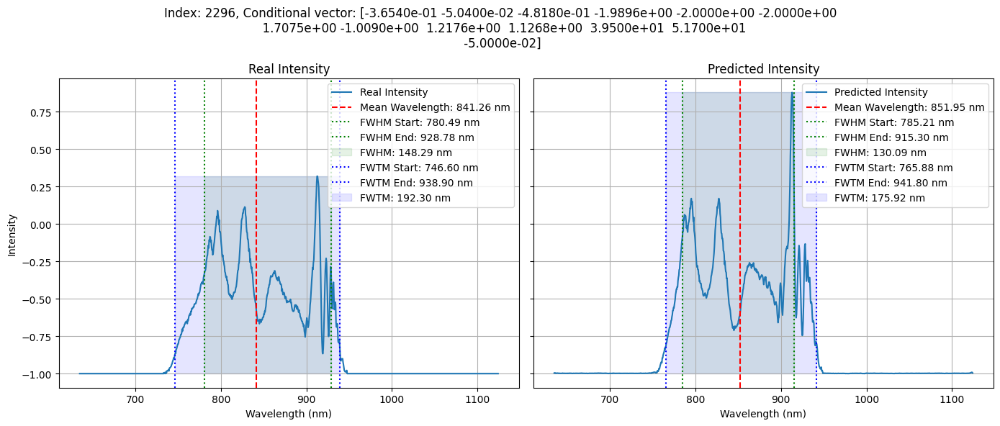

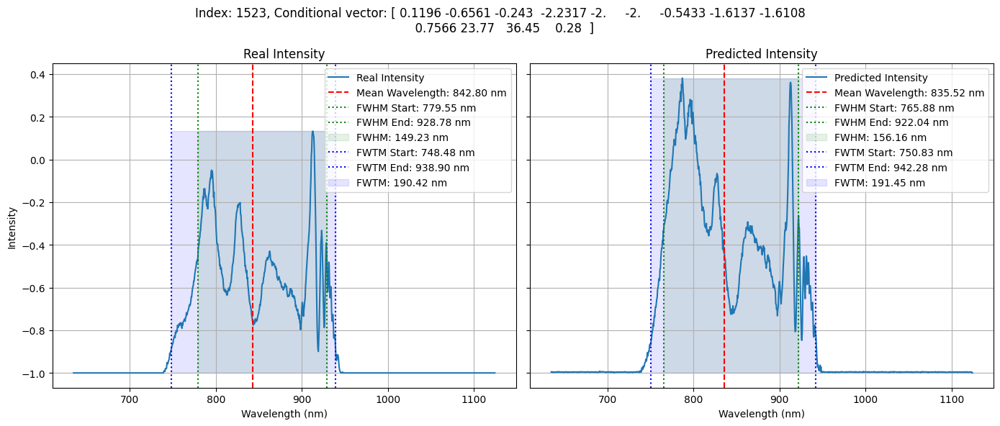

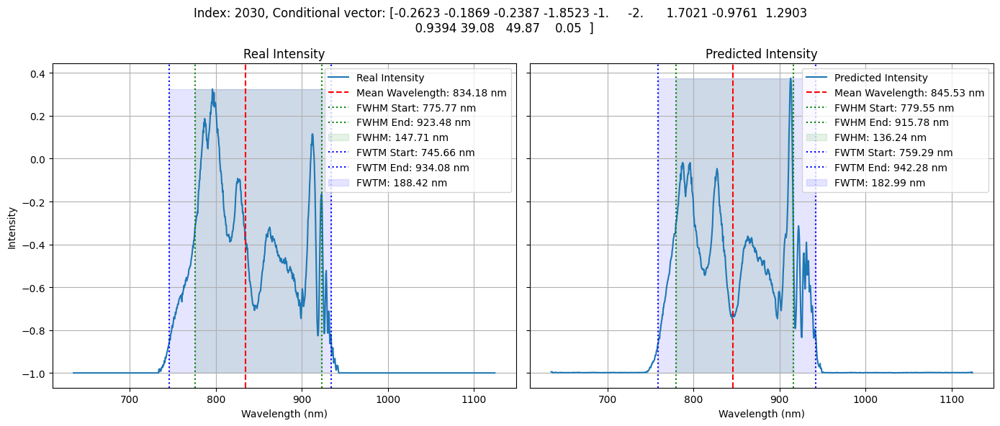

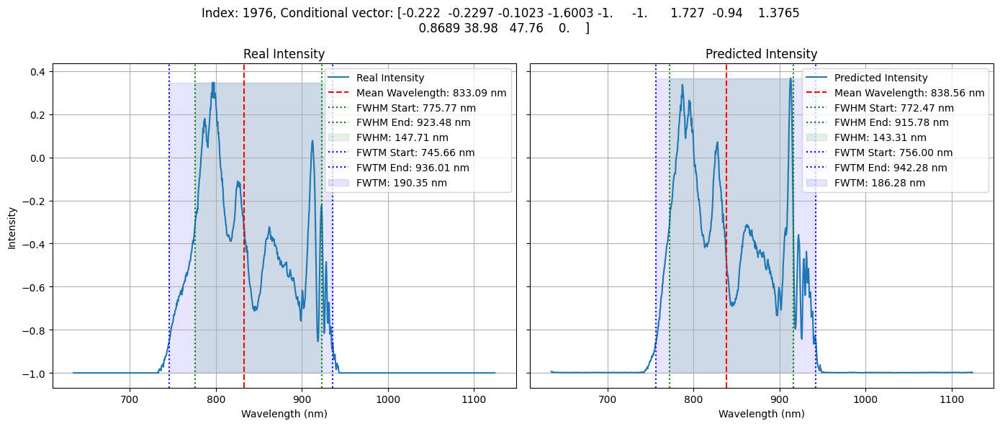

In [23]:
rand_ind = random.randint(len(x_real), size=(10))
for i in rand_ind:
    plot_comparison(index=i, wavelengths=wavelengths, x_real=x_real, predictions=predictions, cond_vectors=cond_vectors)

In [24]:
# Calculate MSE and MAE for the metrics
mse_results, mae_results = calculate_metrics_errors(wavelengths, x_real, predictions)

+-----------------+----------+----------+
| Metric          |      MSE |      MAE |
+=================+==========+==========+
| mean_wavelength |  76.9159 |  7.02413 |
+-----------------+----------+----------+
| std_deviation   |  17.5865 |  3.67898 |
+-----------------+----------+----------+
| fwhm            | 483.102  | 11.8468  |
+-----------------+----------+----------+
| fwhm_start      |  68.7841 |  4.76925 |
+-----------------+----------+----------+
| fwhm_end        | 422.833  |  9.69888 |
+-----------------+----------+----------+
| fwtm            |  40.338  |  5.04168 |
+-----------------+----------+----------+
| fwtm_start      |  80.7693 |  7.0449  |
+-----------------+----------+----------+
| fwtm_end        |  48.9235 |  5.91904 |
+-----------------+----------+----------+


### DTW

In [25]:
dtw_distances = calculate_dtw_distances(x_real, predictions)
mean_dtw = np.mean(dtw_distances)
print(f"Mean DTW Distance: {mean_dtw:.6f}")

Mean DTW Distance: 18.434714


In [26]:
min_values = np.min(dtw_distances, axis=0)  
max_values = np.max(dtw_distances, axis=0)  
mean_values = np.mean(dtw_distances, axis=0)  
median_values = np.median(dtw_distances, axis=0)  

print("Min:", min_values)
print("Max:", max_values)
print("Mean:", mean_values)
print("Median:", median_values)

Min: 1.9969773500000123
Max: 52.044748927098986
Mean: 18.434714095560405
Median: 17.28276739899999


DTW Distance for index 721: 19.945552


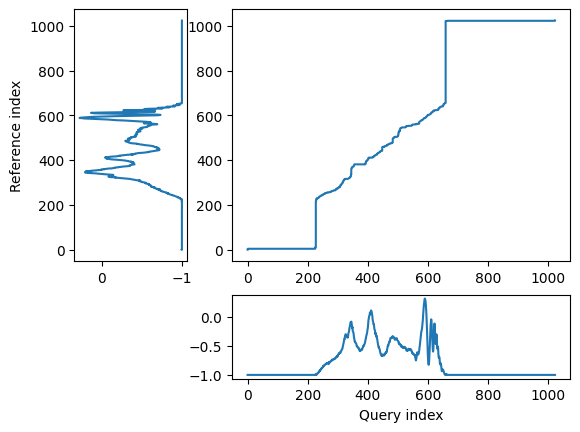

In [27]:
plot_dtw_alignment_for_index(x_real, predictions, 721)

DTW Distance for index 721: 19.945552


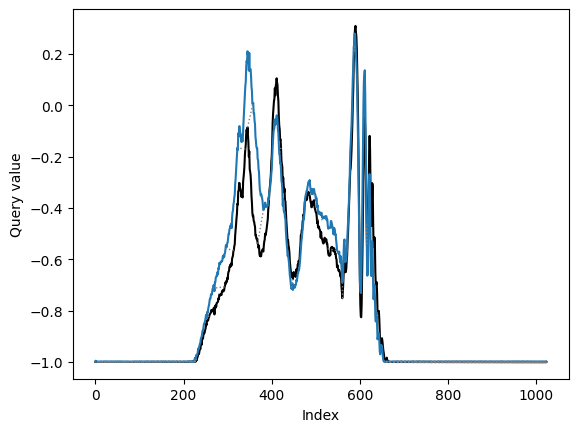

In [28]:
plot_dtw_alignment_for_index(x_real, predictions, 721, plot_type="twoway")

DTW Distance for index 1251: 16.985425


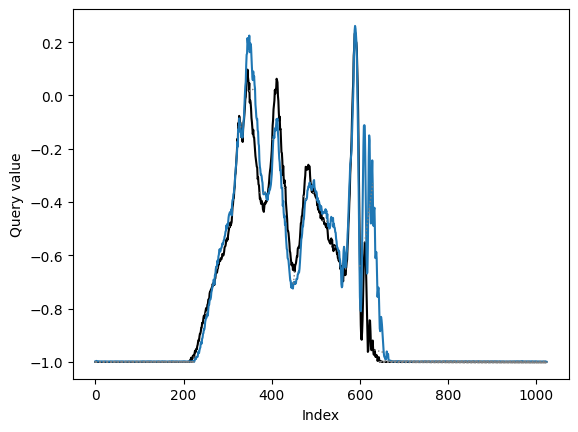

In [29]:
plot_dtw_alignment_for_index(x_real, predictions, 1251, plot_type="twoway")

### Wasserstein

In [30]:
wasserstein_distances, avg_distance = calculate_wasserstein_distance(x_real, predictions)
print(f"Average Wasserstein Distance: {avg_distance}")

Average Wasserstein Distance: 0.028884746847110492


In [31]:
min_values = np.min(wasserstein_distances, axis=0)  
max_values = np.max(wasserstein_distances, axis=0)  
mean_values = np.mean(wasserstein_distances, axis=0)  
median_values = np.median(wasserstein_distances, axis=0)  

print("Min:", min_values)
print("Max:", max_values)
print("Mean:", mean_values)
print("Median:", median_values)

Min: 0.0015896762464986
Max: 0.2052363623929572
Mean: 0.028884746847110492
Median: 0.0032278110224089637
